# Import

In [ ]:
# install dependencies
!pip3 install fastfuels==0.5.3  s3fs==0.5.2 fsspec==0.8.3

In [1]:
import fastfuels
import matplotlib.pyplot as plt

In [1]:
fio = fastfuels.open('https://wifire-data.sdsc.edu:9000/fastfuels/index.fio', ftype='s3', username='fastfuels', password='Treatment##Buffet')
fio.cache_limit = 1e14

NameError: name 'fastfuels' is not defined

# Grassland

https://fuelmap.sdsc.edu/?l=lf-fbfm40-200

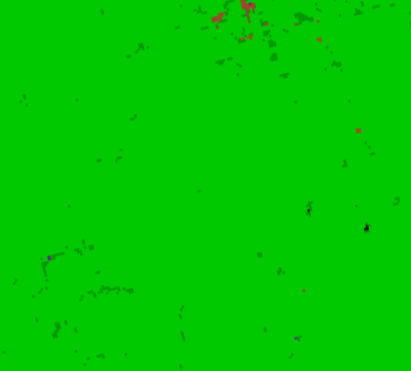

# Grassland #1 (N. California)

In [1]:
lat = 37.289170
lon = -120.059330
roi = fio.query(lon, lat, 15)
roi.view('sav')

NameError: name 'fio' is not defined

Bounding box query found in single source: ca.fio


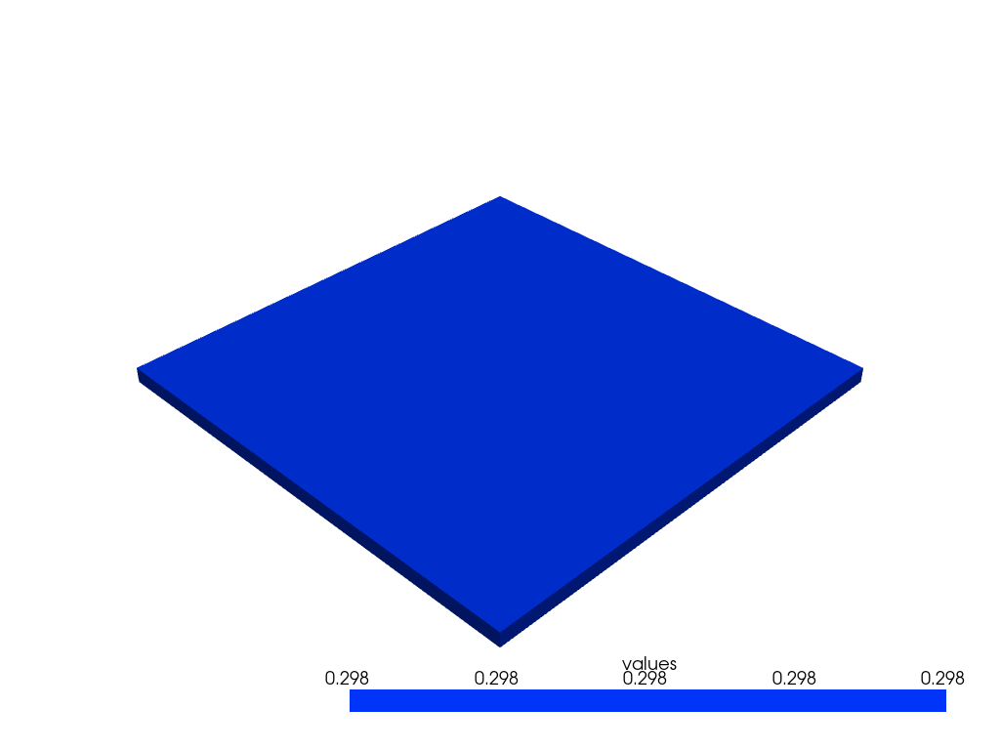

In [104]:
roi = fio.query(lon, lat, 15)
roi.view('fuel_depth')

# Grassland #2 (S. California)

Bounding box query found in single source: ca.fio


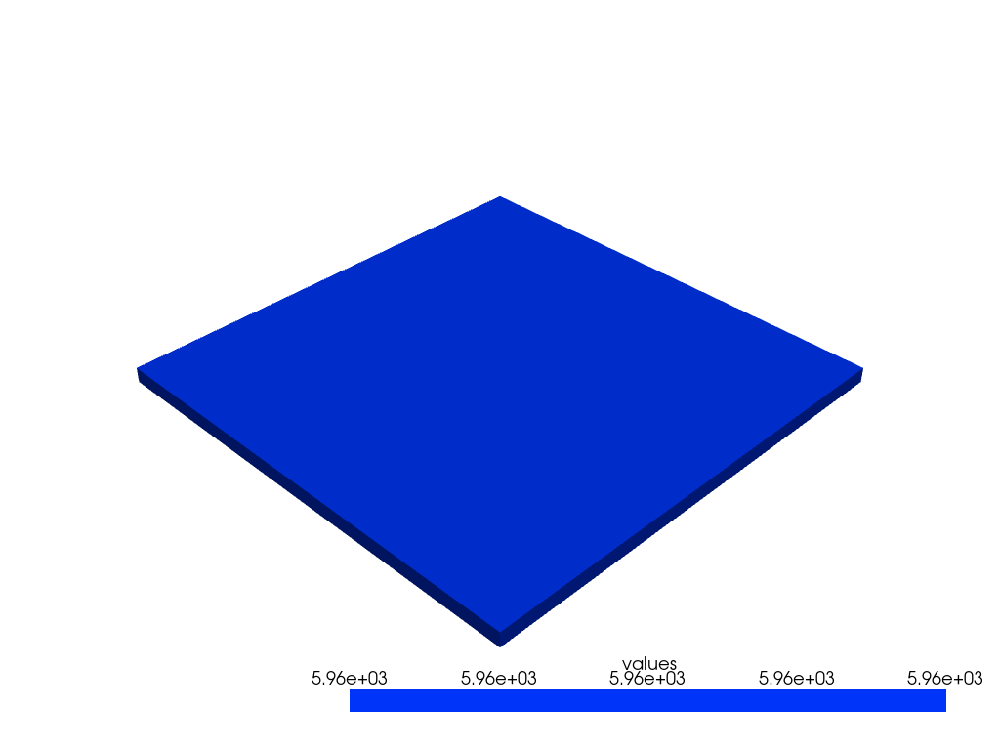

In [105]:
lat = 40.05067
lon = -122.40756
roi = fio.query(lon, lat, 15)
roi.view('sav')

# Grassland #3 (Montana)

Bounding box query found in single source: mt_set/mt_60.fio


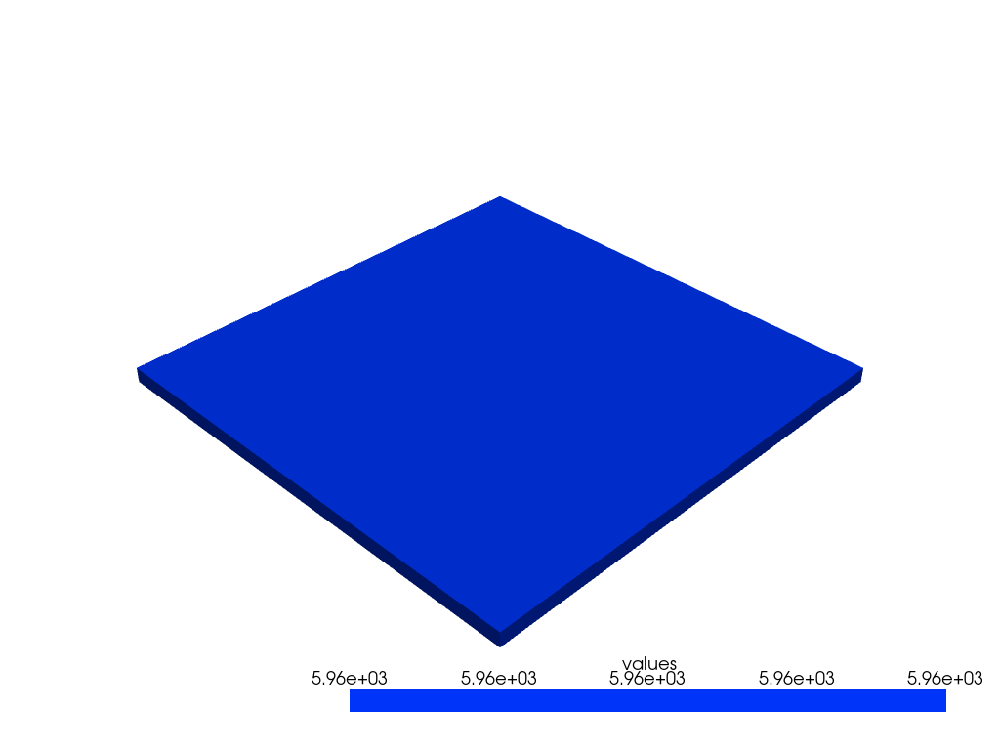

In [107]:
lat = 48.90943
lon = -106.93043
roi = fio.query(lon, lat, 15)
roi.view('sav')

Bounding box query found in single source: or_set/or_89.fio


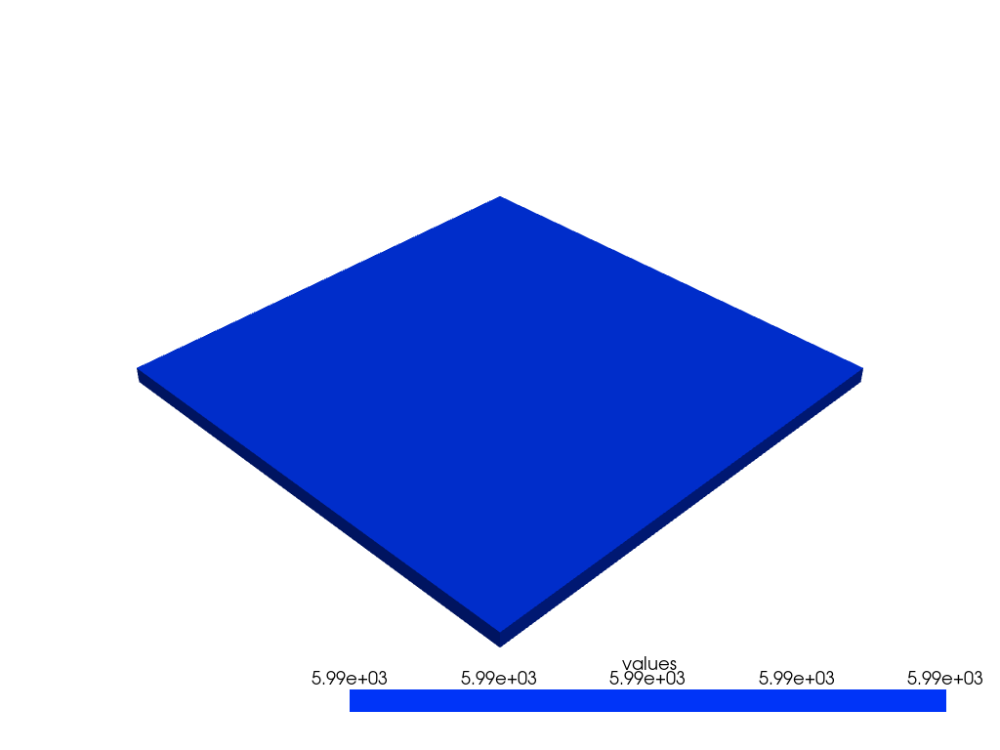

In [121]:
lat = 43.45684
lon = -119.52861
roi = fio.query(lon, lat, 15)
roi.view('sav')

# Pure Grassland

In [155]:
def data_list(maps):
    def get_data(fuel, maps):
        fuel_list = []
        for key in maps:
            roi = fio.query(maps[key][1], maps[key][0], 15)

            sav_data = roi.data_dict[fuel]
            un = np.unique(sav_data[:,:,:])
            fuel_list.append((key, fuel, un))
        return fuel_list


    sav_list = get_data('sav', maps)
    moisture_list = get_data('moisture', maps)
    bulk_density_list = get_data('bulk_density', maps)
    fuel_depth_list = get_data('fuel_depth', maps)
    
    print('\n\n')
    for i in [sav_list, moisture_list, bulk_density_list, fuel_depth_list]:
        for j in i:
            print(j[0], j[1], j[2])
        print('\n')

In [ ]:
roi = fio.query(maps[key][1], maps[key][0], 15)
sav_data = roi.data_dict[fuel]
            un = np.unique(sav_data[:,:,:])

In [156]:
grass_maps = {'NCAL': (37.289170, -120.059330),
       'SCAL': (40.05067, -122.40756),
       'MONT': (48.90943, -106.93043)}

data_list(grass_maps)

Bounding box query found in single source: ca.fio
Bounding box query found in single source: ca.fio
Bounding box query found in single source: mt_set/mt_60.fio
Bounding box query found in single source: ca.fio
Bounding box query found in single source: ca.fio
Bounding box query found in single source: mt_set/mt_60.fio
Bounding box query found in single source: ca.fio
Bounding box query found in single source: ca.fio
Bounding box query found in single source: mt_set/mt_60.fio
Bounding box query found in single source: ca.fio
Bounding box query found in single source: ca.fio
Bounding box query found in single source: mt_set/mt_60.fio



NCAL sav [   0.     5960.7847]
SCAL sav [   0.     5960.7847]
MONT sav [   0.     5960.7847]


NCAL moisture [0.  0.2]
SCAL moisture [0.  0.2]
MONT moisture [0.  0.2]


NCAL bulk_density [0.         0.23529413]
SCAL bulk_density [0.         0.23529413]
MONT bulk_density [0.         0.23529413]


NCAL fuel_depth [0.         0.29803923]
SCAL fuel_depth [0. 

In [ ]:
lat = 43.45684, -119.52861

In [142]:
sav_list

[('NCAL', 'sav', array([   0.    , 5960.7847], dtype=float32)),
 ('SCAL', 'sav', array([   0.    , 5960.7847], dtype=float32)),
 ('MONT', 'sav', array([   0.    , 5960.7847], dtype=float32))]

# Pure Grass-Shrub

In [157]:
grass_shrub_maps = {'NCAL': (43.45684, -119.52861),
       'WYO': (42.68482, -107.34573),
       'AZ': (33.61192, -111.46708)}

data_list(grass_shrub_maps)

Bounding box query found in single source: or_set/or_89.fio
Bounding box query found in single source: wy_set/wy_72.fio
Bounding box query found in single source: az_set/az_72.fio
Bounding box query found in single source: or_set/or_89.fio
Bounding box query found in single source: wy_set/wy_72.fio
Bounding box query found in single source: az_set/az_72.fio
Bounding box query found in single source: or_set/or_89.fio
Bounding box query found in single source: wy_set/wy_72.fio
Bounding box query found in single source: az_set/az_72.fio
Bounding box query found in single source: or_set/or_89.fio
Bounding box query found in single source: wy_set/wy_72.fio
Bounding box query found in single source: az_set/az_72.fio



NCAL sav [   0.    5992.157]
WYO sav [   0.    5992.157]
AZ sav [   0.    5992.157]


NCAL moisture [0.  0.2]
WYO moisture [0.  0.2]
AZ moisture [0.  0.2]


NCAL bulk_density [0.         0.43529415 0.44705886 0.45882356 0.47058827 0.48235297]
WYO bulk_density [0.         0.305

# Chaparral

In [174]:
def get_uniq_sav(coord, radius = 15):
    roi = fio.query(coord[1], coord[0], radius)
    sav_data = roi.data_dict['sav']
    return np.unique(sav_data[:,:,:])

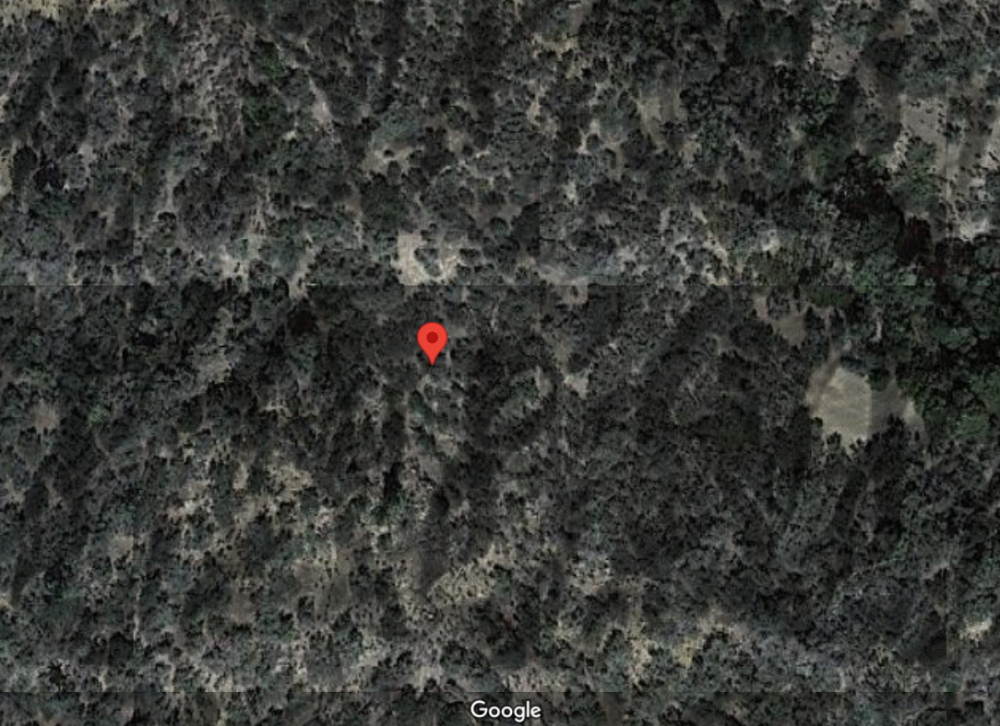

In [175]:
get_uniq_sav((34.748277, -119.481306))

Bounding box query found in single source: ca.fio


array([   0.    , 5960.7847, 5992.157 ], dtype=float32)

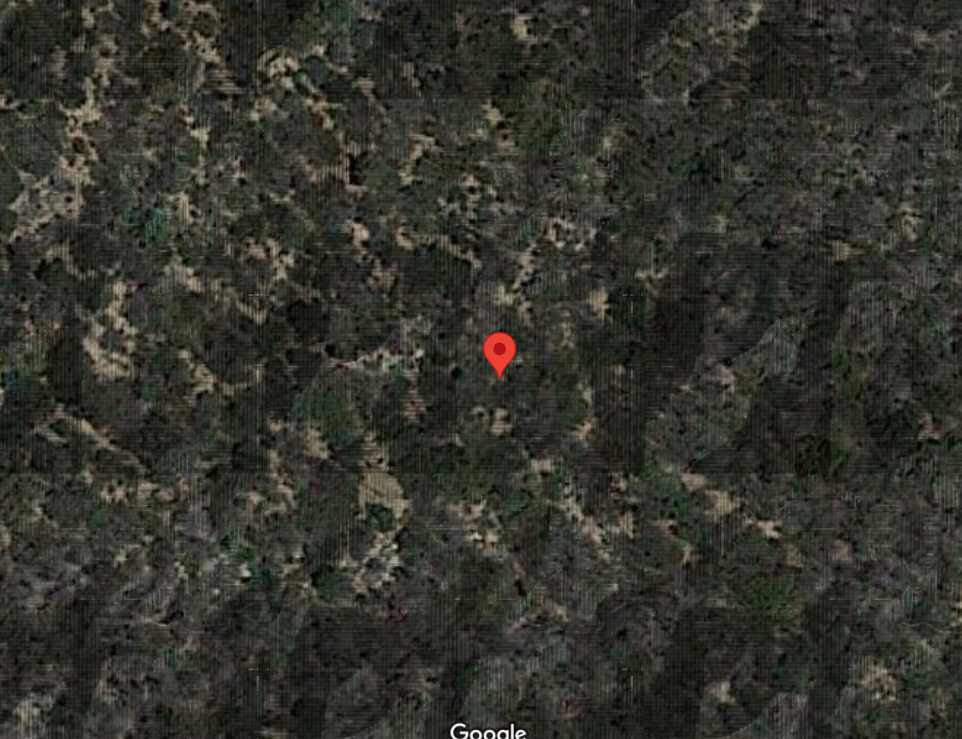

In [176]:
get_uniq_sav((34.599376, -118.345203))

Bounding box query found in single source: ca.fio


array([   0.    , 5960.7847, 5992.157 ], dtype=float32)

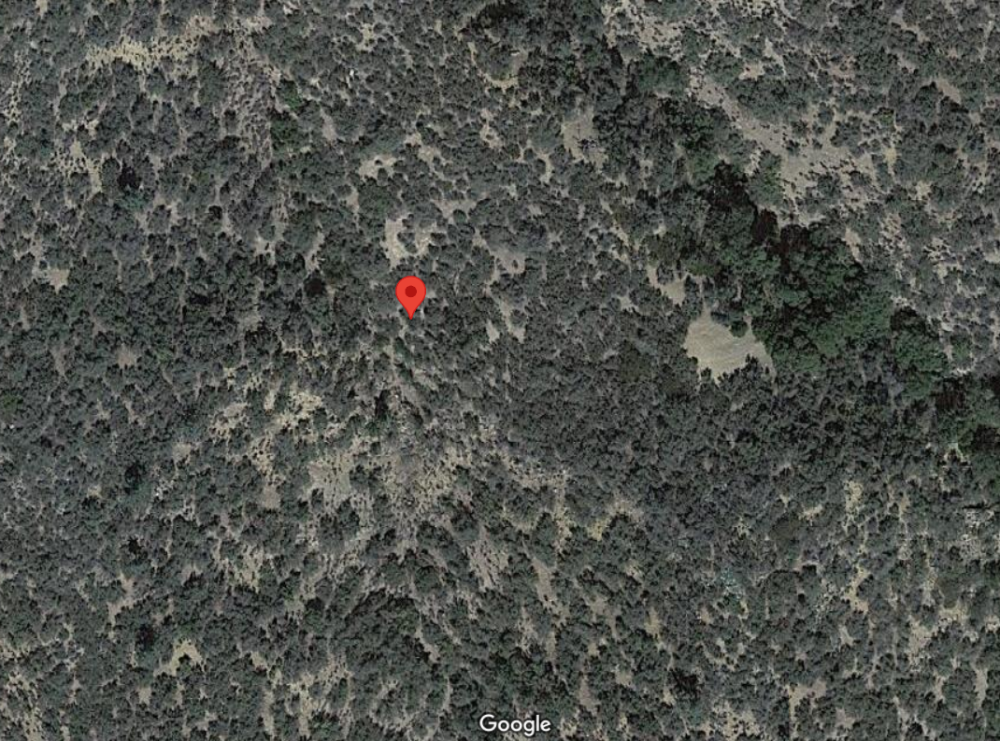

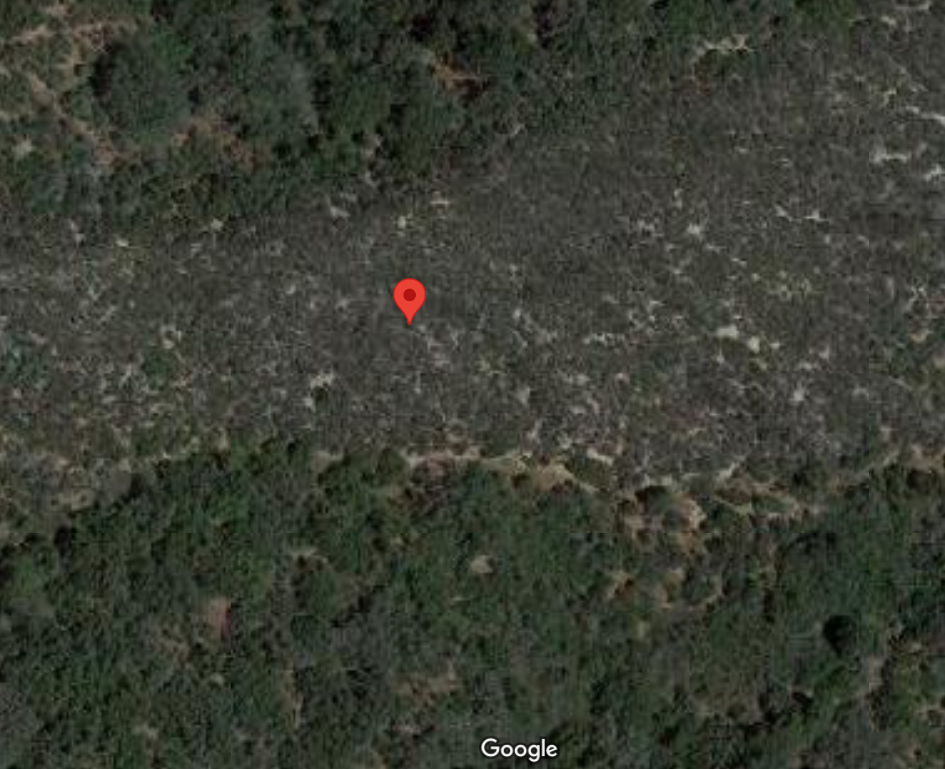

In [186]:
get_uniq_sav((34.604198, -118.340222))

Bounding box query found in single source: ca.fio


array([   0.   , 5992.157, 6556.863], dtype=float32)

In [187]:
get_uniq_sav((34.604198, -118.340222), 3)

Bounding box query found in single source: ca.fio


array([   0.   , 5992.157], dtype=float32)

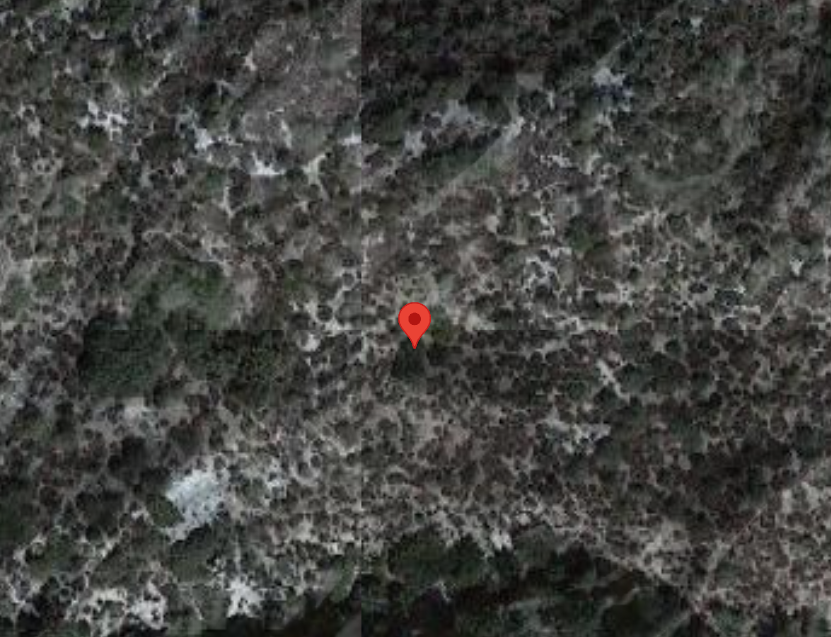

In [245]:
get_uniq_sav((33.198447, -116.673314), 15)

Bounding box query found in single source: ca.fio


array([   0.   , 5992.157], dtype=float32)

# Label Chaparral

In [259]:
def label_data(coord, radius = 15, proportion = 0.75):
    roi = fio.query(coord[1], coord[0], radius)
    sav_data = roi.data_dict['sav'][:,:,0]
    chap_sav = [5992.157, 5960.784, 6556.863] #7
    
    chap = 0
    not_chap = 0
    type(chap_sav[0])
    for i in sav_data:
        for j in i:
            if (int(j.item() * 1000) / 1000) in chap_sav:
                chap += 1
            else:
                not_chap += 1
    
    print(chap / (chap + not_chap))
    if chap / (chap + not_chap) >= 0.75:
        return 'chap'
    else:
        return 'not_chap'

In [289]:
label_data((34.616735, -118.371864), 2)

Bounding box query found in single source: ca.fio
1.0


'chap'

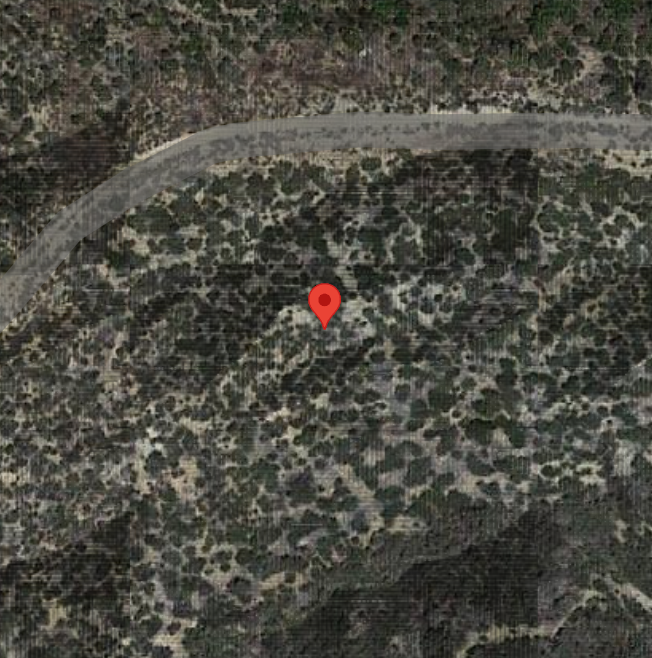

In [292]:
label_data((34.492384, -118.455263))

Bounding box query found in single source: ca.fio
0.43666666666666665


'not_chap'

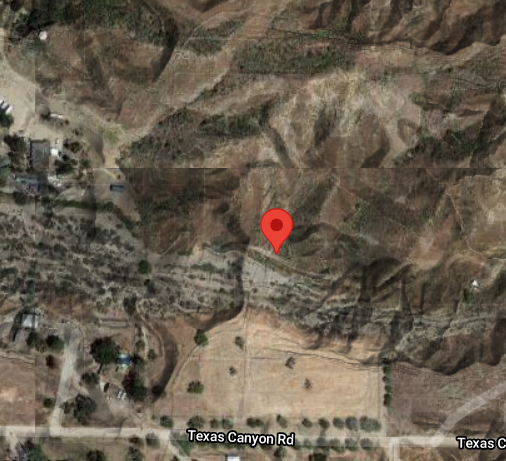

In [291]:
label_data((34.492915, -118.460493))

Bounding box query found in single source: ca.fio
0.8433333333333334


'chap'

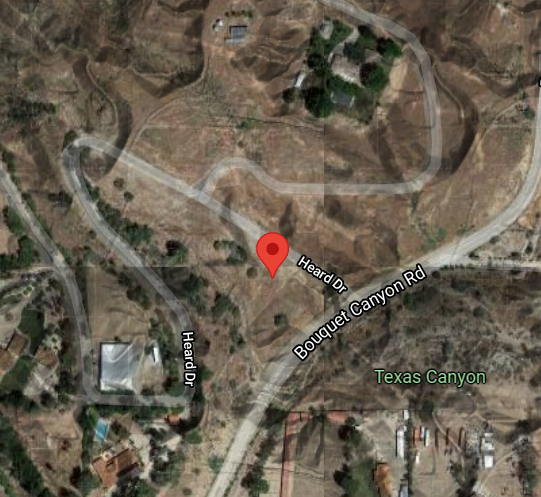